<a href="https://colab.research.google.com/github/varuntulsian2001/density_estimation_diffusion_models/blob/master/5.colab_EMNIST_conditional.diffusion_model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Generating complex densities using Diffusion models

1. moving to alphabets and number generation using diffusion models
    * We will be using JAX
    * Using U-net blocks for modelling the denoising process

In [74]:
!pip install --upgrade -q clu einops dm-haiku optax flax
!pip install --upgrade -q dm-tree graphviz imageio[ffmpeg]

In [75]:
import haiku as hk
import jax
import jax.numpy as jnp
import einops
import math
from typing import Iterator, Mapping, Tuple
from copy import deepcopy
import time
from absl import app
import haiku as hk
import matplotlib.pyplot as plt
import jax
import jax.numpy as jnp
import numpy as np
import optax
import tensorflow_datasets as tfds
import tensorflow as tf
from functools import partial
import math
import os
from flax import jax_utils

colab = True

if not colab:
  os.environ["XLA_PYTHON_CLIENT_PREALLOCATE"] = "false"
  jax.config.update('jax_platform_name', 'cpu')
Batch = Tuple[np.ndarray, np.ndarray]

In [76]:
if colab:
  from google.colab import drive
  drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [77]:
train_new_model = True
cont=True
model_name = 'emnist_fixed_with_cond.jax_version'

import os
import os.path as osp

if not colab:
  data_paths = osp.join(os.getcwd(), 'saved', 'saved_data')
  model_paths = osp.join(os.getcwd(), 'saved','saved_models')
  gifs_dir = osp.join(os.getcwd(), 'gifs')+"/"
  dataset_path = "/home/varun/tensorflow_datasets/"
else:
  data_paths = F"/content/gdrive/MyDrive/EMNIST/data/"
  model_paths = F"/content/gdrive/MyDrive/EMNIST/model/"
  gifs_dir = F"/content/gdrive/MyDrive/EMNIST/gifs/"
  dataset_path = F"/content/gdrive/MyDrive/EMNIST/dataset/"

In [78]:
# utils 
import pickle

def load_cached(filename):
    with open(filename, 'rb') as ff:
        return pickle.load(ff)
    
def write_cached(data, filename):
    with open(filename, 'wb') as ff:
        pickle.dump(data, ff, protocol=pickle.HIGHEST_PROTOCOL)

In [79]:
# train model

# ####### i am not getting desired results with the cosine beta schedule from the hugging face repo
def cosine_beta_schedule(timesteps, s=0.008):
    """
    cosine schedule as proposed in https://arxiv.org/abs/2102.09672
    """
    steps = timesteps + 1
    x = jnp.linspace(0, timesteps, steps)
    alphas_cumprod = jnp.cos(((x / timesteps) + s) / (1 + s) * jnp.pi * 0.5) ** 2
    alphas_cumprod = alphas_cumprod / alphas_cumprod[0]
    betas = 1 - (alphas_cumprod[1:] / alphas_cumprod[:-1])
    return jnp.clip(betas, 0.0001, 0.1)

def linear_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start, beta_end, timesteps)

def quadratic_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    return jnp.linspace(beta_start**0.5, beta_end**0.5, timesteps) ** 2

def sigmoid_beta_schedule(timesteps):
    beta_start = 0.0001
    beta_end = 0.02
    betas = jnp.linspace(-6, 6, timesteps)
    return jnp.sigmoid(betas) * (beta_end - beta_start) + beta_start

In [80]:
# Train model
timesteps = 200
# betas = linear_beta_schedule(timesteps)
betas = cosine_beta_schedule(timesteps)
alphas = 1 - betas
alphas_ = jnp.cumprod(alphas, axis=0)
variance = 1 - alphas_
sd = jnp.sqrt(variance)

alphas_prev_ = jnp.pad(alphas_[:-1], [1, 0], "constant", constant_values=1.0)
sigma_squared_q_t = (1 - alphas) * (1 - alphas_) / (1 - alphas_prev_)
log_sigma_squared_q_t = jnp.log(1-alphas) + jnp.log(1-alphas_) - jnp.log(1-alphas_prev_)
sigma_squared_q_t_corrected = jnp.exp(log_sigma_squared_q_t)
key = jax.random.PRNGKey(42)

# how to add noise to the data
@jax.jit
def get_noisy(rng, batch, timestep):
    timestep = einops.repeat(timestep, 'b -> b 28 28 1')
    # we will use the reparameterization trick
    # need to generate new keys everytime
    _, noise_key = jax.random.split(rng)
    noise_at_t = jax.random.normal(noise_key, shape=batch.shape)
    added_noise_at_t = jnp.add(batch * jnp.sqrt(alphas_[timestep]), noise_at_t * sd[timestep])
    return added_noise_at_t, noise_at_t

def recover_original(batch, timestep, noise):
    true_data = (batch.sub(noise.mul(sd[timestep]))).div(jnp.sqrt(alphas_[timestep]))
    return true_data

posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)

## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))

# not sure why we are multiplying by 1/2 here
posterior_variance_corrected = jnp.exp(log_posterior_variance)

([<matplotlib.lines.Line2D at 0x7f62f8259f40>],
 [<matplotlib.lines.Line2D at 0x7f62f8213250>])

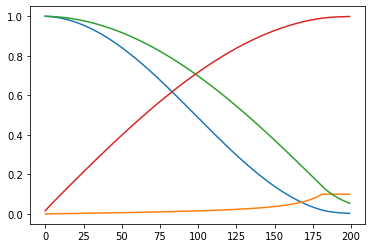

In [81]:
plt.plot(alphas_), plt.plot(posterior_variance_corrected), plt.plot(jnp.sqrt(alphas_)), plt.plot(sd)

In [82]:
#@title utils
# Various helper utility functions.

import io
import math
from IPython.display import display_png
import matplotlib as mpl
import matplotlib.cm as cm
from clu import deterministic_data

def imify(arr, vmin=None, vmax=None, cmap=None, origin=None):
  """Convert an array to an image.

  Arguments:
    arr : array-like The image data. The shape can be one of MxN (luminance),
      MxNx3 (RGB) or MxNx4 (RGBA).
    vmin : scalar, optional lower value.
    vmax : scalar, optional *vmin* and *vmax* set the color scaling for the
      image by fixing the values that map to the colormap color limits. If
      either *vmin* or *vmax* is None, that limit is determined from the *arr*
      min/max value.
    cmap : str or `~matplotlib.colors.Colormap`, optional A Colormap instance or
      registered colormap name. The colormap maps scalar data to colors. It is
      ignored for RGB(A) data.
        Defaults to :rc:`image.cmap` ('viridis').
    origin : {'upper', 'lower'}, optional Indicates whether the ``(0, 0)`` index
      of the array is in the upper
        left or lower left corner of the axes.  Defaults to :rc:`image.origin`
          ('upper').

  Returns:
    A uint8 image array.
  """
  sm = cm.ScalarMappable(cmap=cmap)
  sm.set_clim(vmin, vmax)
  if origin is None:
    origin = mpl.rcParams["image.origin"]
  if origin == "lower":
    arr = arr[::-1]
  rgba = sm.to_rgba(arr, bytes=True)
  return rgba

def rawarrview(array, **kwargs):
  """Visualize an array as if it was an image in colab notebooks.

  Arguments:
    array: an array which will be turned into an image.
    **kwargs: Additional keyword arguments passed to imify.
  """
  f = io.BytesIO()
  imarray = imify(array, **kwargs)
  plt.imsave(f, imarray, format="png")
  f.seek(0)
  dat = f.read()
  f.close()
  display_png(dat, raw=True)


def reshape_image_batch(array, cut=None, rows=None, axis=0):
  """Given an array of shape [n, x, y, ...] reshape it to create an image field.

  Arguments:
    array: The array to reshape.
    cut: Optional cut on the number of images to view. Will default to whole
      array.
    rows: Number of rows to use.  Will default to the integer less than the
      sqrt.
    axis: Axis to interpretate at the batch dimension.  By default the image
      dimensions immediately follow.

  Returns:
    reshaped_array: An array of shape [rows * x, cut / rows * y, ...]
  """
  original_shape = array.shape
  assert len(original_shape) >= 2, "array must be at least 3 Dimensional."

  if cut is None:
    cut = original_shape[axis]
  if rows is None:
    rows = int(math.sqrt(cut))

  cols = cut // rows
  cut = cols * rows

  leading = original_shape[:axis]
  x_width = original_shape[axis + 1]
  y_width = original_shape[axis + 2]
  remaining = original_shape[axis + 3:]

  array = array[:cut]
  array = array.reshape(leading + (rows, cols, x_width, y_width) + remaining)
  array = np.moveaxis(array, axis + 2, axis + 1)
  array = array.reshape(leading + (rows * x_width, cols * y_width) + remaining)
  return array

def zoom(im, k, axes=(0, 1)):
  for ax in axes:
    im = np.repeat(im, k, ax)
  return im


def imgviewer(im, zoom=3, cmap='bone_r', normalize=False, **kwargs):
  if normalize:
    im = im - im.min()
    im = im / im.max()
  return rawarrview(zoom(im, zoom), cmap=cmap, **kwargs)

# replicate = flax.jax_utils.replicate
# unreplicate = flax.jax_utils.unreplicate

In [83]:
#@title data

dataset_builder = tfds.builder('emnist', data_dir=dataset_path)
dataset_builder.download_and_prepare()

train_split = tfds.split_for_jax_process('train+train', drop_remainder=True)

def preprocess_fn(example):
  image = tf.cast(example['image'], 'float32')
  image = tf.transpose(image, (1, 0, 2,))
  image = image / 255.0
  return (image, example["label"] + 1)

batch_size = 4 * 128
train_ds = deterministic_data.create_dataset(
    dataset_builder,
    split=train_split,
    rng=jax.random.PRNGKey(0),
    shuffle_buffer_size=100,
    batch_dims=[jax.local_device_count(), batch_size // jax.device_count()],
    num_epochs=None,
    preprocess_fn=lambda x: preprocess_fn(x),
    shuffle=True)

def create_input_iter(ds):
  def _prepare(xs):
    def _f(x):
      x = x._numpy()
      return x
    return jax.tree_util.tree_map(_f, xs)
  it = map(_prepare, ds)
  it = jax_utils.prefetch_to_device(it, 2)
  return it

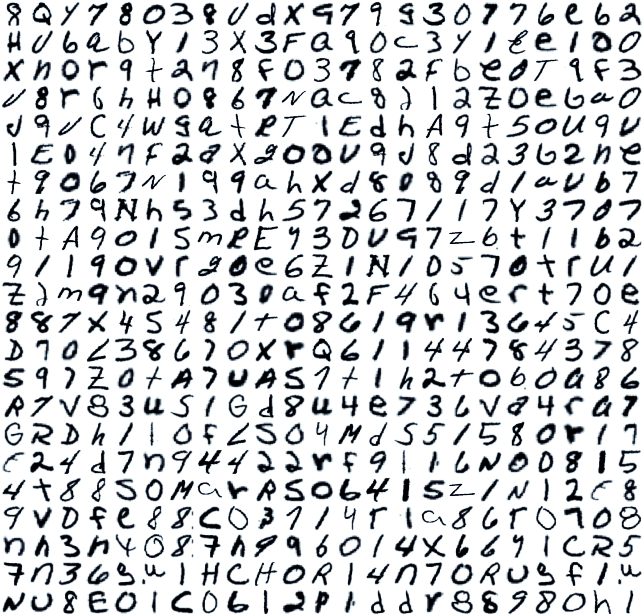

In [84]:
out = next(create_input_iter(train_ds))
rawarrview(reshape_image_batch(out[0][0].squeeze()), cmap='bone_r')

In [85]:
# adapted from Optax loss -- https://github.com/deepmind/optax/blob/master/optax/_src/loss.py
@jax.jit
def huber_loss(
    predictions,
    targets= None,
    delta= 1.):
  """Huber loss, similar to L2 loss close to zero, L1 loss away from zero.
  If gradient descent is applied to the `huber loss`, it is equivalent to
  clipping gradients of an `l2_loss` to `[-delta, delta]` in the backward pass.
  References:
    [Huber, 1964](www.projecteuclid.org/download/pdf_1/euclid.aoms/1177703732)
  Args:
    predictions: a vector of arbitrary shape `[...]`.
    targets: a vector with shape broadcastable to that of `predictions`;
      if not provided then it is assumed to be a vector of zeros.
    delta: the bounds for the huber loss transformation, defaults at 1.
  Returns:
    elementwise huber losses, with the same shape of `predictions`.
  """
  errors = (predictions - targets) if (targets is not None) else predictions
  # 0.5 * err^2                  if |err| <= d
  # 0.5 * d^2 + d * (|err| - d)  if |err| > d
  abs_errors = jnp.abs(errors)
  quadratic = jnp.minimum(abs_errors, delta)
  # Same as max(abs_x - delta, 0) but avoids potentially doubling gradient.
  linear = abs_errors - quadratic
  return jnp.sum(0.5 * quadratic ** 2 + delta * linear, axis=(1, 2, 3))

# def load_dataset(
#     split: str,
#     *,
#     is_training: bool,
#     batch_size: int,
# ) -> Iterator[tuple]:
#   """Loads the dataset as a generator of batches."""
#   # cache the dataset to memory and repeat it indefinitely, epochs have reshuffled ordered data since *reshuffle_each_iteration* defaults to TRUE
#   ds = tfds.load('emnist', split=split, data_dir=dataset_path, as_supervised=True).cache().repeat()
#   if is_training:
#     # shuffle the batches to improve generalization of the trained network
#     ds = ds.shuffle(400 * batch_size, seed=0)
#   ds = ds.batch(batch_size)
#   return iter(tfds.as_numpy(ds))

# Recommended: this can be jit'd and it should result in faster training time 
@jax.jit
def compute_loss(params: hk.Params, batch: Batch, is_energy_method: bool=False) -> jnp.ndarray:
  """Compute the loss of the network, including L2."""
  x, label, timestep, noise = batch
  pred_data = net.apply(params, x, timestep, label)
  
  def error_func():
    imp_weight = 1.0 # 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (variance[timestep] * alphas[timestep]))
      # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(noise, pred_data)))
    return loss_
  
  def energy_func():
    ## Energy function interpretation
    imp_weight = 1.0 # 1/2 * (1/sigma_squared_q_t_corrected[timestep]) * ((betas[timestep])**2 / (alphas[timestep]))
    # loss on prediction
    loss_ = jnp.sum(jnp.multiply(imp_weight, huber_loss(pred_data, jnp.divide(noise, -sd[timestep]))))
    return loss_
    
  loss_ = jax.lax.cond(is_energy_method, energy_func, error_func)
  return loss_ 

@jax.jit
def update(
    params: hk.Params,
    opt_state: optax.OptState,
    batch: Batch,
    is_energy_method: bool=False
) -> Tuple[hk.Params, optax.OptState]:
  """Compute gradients and update the weights"""
  loss_value, grads = jax.value_and_grad(compute_loss)(params, batch, is_energy_method)
  updates, opt_state = opt.update(grads, opt_state)
  new_params = optax.apply_updates(params, updates)
  return loss_value, new_params, opt_state

@jax.jit
def ema_update(params, avg_params):
  """Incrementally update parameters via polyak averaging."""
  # Polyak averaging tracks an (exponential moving) average of the past parameters of a model, for use at test/evaluation time.
  return optax.incremental_update(params, avg_params, step_size=0.95)

# @jax.jit
# def normalize(images):
#   # numpy array creation could be moved out of the method
#   # mean = np.asarray(EMNIST_MEAN)
#   # std = np.asarray(EMNIST_STD)

#   # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
#   x = images.astype(jnp.float32) / 255.

#   # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
#   # x -= mean  # operations uses numpy broadcasting to work correctly
#   # x /= std 

#   return x

@jax.jit
def unnormalize(images):
  # mean = np.asarray(EMNIST_MEAN)
  # std = np.asarray(EMNIST_STD)

  # # BUG 3: int8 range is -128 to 127 causing issues with numbers > 127, uint8 / 255. is float64, casting as float32 since that's the type jax prefers
  # x = images.astype(jnp.float32)

  # # BUG 4: x /- mean just divides x by -1. * mean without reassignment to x
  # x *= std 
  # x += mean  # operations uses numpy broadcasting to work correctly
  
  return images*255.
  

In [86]:
# using 20% of the dataset for training, 80% for validation, although it's weird to use maximum available data for validation
# BUG: using 80% train data, since performance improvement beyond 50% wasn't seen with 20% train data
# batch_size=512
# train = load_dataset("train+test", is_training=True, batch_size=batch_size)

In [87]:
%%capture 
# % matplotlib inline 
# to discard cell output

import matplotlib.animation as animation
import imageio 
from IPython.display import Image
from matplotlib.pyplot import figure

random_index = 22
image = next(create_input_iter(train_ds))[0][0][random_index]
fig = plt.figure()
ims = []
noisy_images, _ = get_noisy(key, einops.repeat(image, 'h w c -> b h w c', b=timesteps//5), jnp.arange(1, timesteps, 5))
if colab:
  noisy_images = einops.rearrange(noisy_images, 'b h w c -> b h (w c)')
noisy_images = unnormalize(noisy_images)

for i in range(timesteps//10):
    im = plt.imshow(noisy_images[i], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir+'diffusion.gif', writer='pillow')

def show_image(img, plt_):
  figure(figsize=(2, 2))
  if colab:
    img = einops.rearrange(img, 'h w c -> h (w c)')
  plt_.imshow(img, cmap="gray", animated=False)

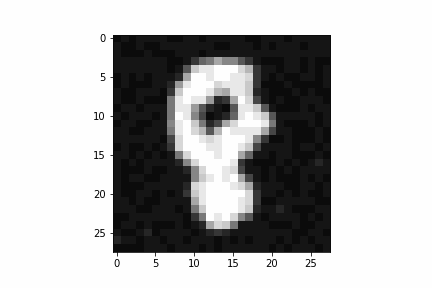

In [88]:
with open(gifs_dir + 'diffusion.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

In [89]:
# upsample operation in the UNET
class Downsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(4, 4), stride=2, padding=[1, 1])
  
  def __call__(self, x):
    return self.conv(x)
  
# Downsample operation in the UNET
class Upsample(hk.Module):
  def __init__(self, output_channels):
    super().__init__()
    self.conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(3, 3), padding='SAME')
  
  def __call__(self, x):
    # scaling image to twice size
    x = einops.repeat(x, 'b h w c -> b (a h) (aa w) c', a=2, aa=2)
    return self.conv(x)
      
class TimeEmbeddings(hk.Module):
  def __init__(self, dim):
    super().__init__()
    half_dim = dim // 2
    embeddings = math.log(10000) / (half_dim - 1)
    self.embeddings = jnp.exp(jnp.arange(half_dim) * -embeddings)

  def __call__(self, timesteps):
      embeddings = self.embeddings
      embeddings = jnp.multiply(timesteps[:, None], embeddings[:, None].T)
      embeddings = jnp.hstack([jnp.sin(embeddings), jnp.cos(embeddings)])
      return embeddings

class Block(hk.Module):
  # a basic resnet style convolutional block
  def __init__(self, output_channels, kernel_size, padding):
    super().__init__()
    self.proj = hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME')
    self.ln = hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True)
    self.seq = hk.Sequential([
      jax.nn.silu,
      hk.Conv2D(output_channels=output_channels, kernel_shape=(kernel_size, kernel_size), padding='SAME'),
      hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True),
      jax.nn.silu,
    ])
    self.out_conv = hk.Conv2D(output_channels=output_channels, kernel_shape=(1, 1), padding='SAME') 
    # self.time_mlp = None
    dims = output_channels
    self.time_mlp = hk.Sequential([
      jax.nn.silu,
      hk.Linear(dims*2),
    ])
    
  def __call__(self, x, timestep_embeddings=None):
    h = self.proj(x)
    h = self.ln(h)
    if timestep_embeddings is not None and self.time_mlp is not None:
      time_embedding = self.time_mlp(timestep_embeddings)
      time_embedding = einops.rearrange(time_embedding, 'b c -> b 1 1 c')
      shift, scale = jnp.split(time_embedding, indices_or_sections=2, axis=-1)
      h = shift + (scale+1)*h
    
    h = self.seq(h)
    return self.out_conv(x) + h

In [90]:
# Unet class to predict noise from a given image
class UNet(hk.Module):
  def __init__(self):
    super().__init__()
    self.init_conv = hk.Conv2D(output_channels=32, kernel_shape = (5,5), padding='SAME')
    self.silu = jax.nn.silu
    self.block1 = Block(output_channels=32, kernel_size=3, padding=1)
    self.downsample1 = Downsample(64)
    self.block2 = Block(output_channels=64, kernel_size=3, padding=1)
    self.downsample2 = Downsample(128)
    self.middle_block = Block(output_channels=128, kernel_size=3, padding=1)
    self.upsample1 = Upsample(64)
    self.block3 = Block(output_channels=64, kernel_size=3, padding=1)
    self.upsample2 = Upsample(32)
    self.block4 = Block(output_channels=32, kernel_size=3, padding=1)
    self.seq = hk.Sequential([
        hk.Conv2D(output_channels=32, kernel_shape = (3,3), padding='SAME'),
        hk.LayerNorm(axis=(-3, -2, -1), create_scale=True, create_offset=True),
        jax.nn.silu,
        hk.Conv2D(output_channels=1, kernel_shape = (5,5), padding='SAME'),
    ])
    self.time_mlp = hk.Sequential([
      hk.Linear(256),
      jax.nn.gelu,
      hk.Linear(256),
    ])
    # conditional vectors encoding
    self.embedding_vectors = hk.Embed(10+26+26+1, 64)
    self.timestep_embeddings = TimeEmbeddings(64)
      
  def __call__(self, x, timesteps, cond=None):
    cond_embedding = None
    conditioning = None
    if timesteps is not None:
      timestep_embeddings = self.timestep_embeddings(timesteps)
      conditioning = timestep_embeddings
    if cond is not None:
      label_embeddings = self.embedding_vectors(cond)
      conditioning = jnp.concatenate([label_embeddings, conditioning], axis=1)
    if conditioning is not None:  
      cond_embedding = self.time_mlp(conditioning)
    h = self.init_conv(x)
    xx = jnp.copy(h)
    b1 = self.block1(self.silu(h), cond_embedding)
    h = self.downsample1(b1)
    b2 = self.block2(h, cond_embedding)
    h = self.downsample2(b2)
    h = self.upsample1(self.middle_block(h, cond_embedding))
    b3 = self.block3(jnp.concatenate((h, b2), axis=3), cond_embedding)
    h = self.upsample2(b3)
    b4 = self.block4(jnp.concatenate((h, b1), axis=3), cond_embedding)
    h = self.seq(jnp.concatenate((xx, b4), axis=3))
    return h

In [91]:
def save(ckpt_dir: str, state, model_name) -> None:
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "wb") as f:
    for x in jax.tree_util.tree_leaves(state):
         np.save(f, x, allow_pickle=False)
    tree_struct = jax.tree_map(lambda t: 0, state)
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "wb") as f:
     pickle.dump(tree_struct, f)

def restore(ckpt_dir, model_name):
  with open(os.path.join(ckpt_dir, model_name+"_tree.pkl"), "rb") as f:
    tree_struct = pickle.load(f)
 
  leaves, treedef = jax.tree_util.tree_flatten(tree_struct)
  with open(os.path.join(ckpt_dir, model_name+"_arrays.npy"), "rb") as f:
    flat_state = [np.load(f) for _ in leaves]

  return jax.tree_util.tree_unflatten(treedef, flat_state)

def test_model_save():
  save('saved/saved_models/', avg_params, 'emnist_model')
  avg_params = restore('saved/saved_models/', 'emnist_model')

In [92]:
import graphviz

def f(x, timesteps, label):
  unet = UNet()
  return unet(x, timesteps, label)

f_t = hk.transform(f)
net = hk.without_apply_rng(f_t)

image, label = next(create_input_iter(train_ds)) #jnp.ones([100, 28, 28, 1])
timesteps_ = jnp.arange(0, 10)

_, rng = jax.random.split(key)

if cont and os.path.exists(osp.join(model_paths, model_name + '_tree.pkl')):
  params = avg_params = restore(model_paths, model_name)
else:
  params = net.init(rng, (image[0][0:10]), timesteps_, label[0][0:10])

# dot = hk.experimental.to_dot(f_t.apply)(params, None, x, timesteps)
# graphviz.Source(dot)

# print(hk.experimental.tabulate(f_t)(x, timesteps_))

opt = optax.adam(1e-3)

avg_params = deepcopy(params)
opt_state = opt.init(params)



---




### Training

In [93]:
def show_predicted_image(noisy_image, params, timestep, label=None):
  print('time step for image', timestep)
  timestep = jnp.array([timestep])
  pred_noise = net.apply(params, noisy_image, timestep, label)
  pred_image = noisy_image/jnp.sqrt(alphas_[timestep]) - pred_noise*sd[timestep]/jnp.sqrt(alphas_[timestep])
  _, (p1, p2) = plt.subplots(1, 2)
  show_image(unnormalize(pred_image[0]), p1)
  show_image(unnormalize(noisy_image[0]), p2)
  plt.show()
  return huber_loss(noisy_image, pred_image)
  
# show random images
# show_predicted_image(x, avg_params, 10)

In [94]:
b, l = image[0], label[0] # next(create_input_iter(train_ds))[0]

unique_key = jax.random.fold_in(key, jnp.sum(b))
_, *subkeys = jax.random.split(unique_key, timesteps)

time step for image 199


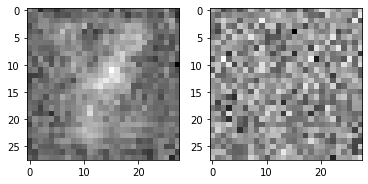

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

[363.92102]


In [95]:
def test_loss_fn():
  loss_ = []
  huber_loss_ = []
  huber_loss_weighted = []
  imp_weight_ = []
  model_huber_loss = []
  for i in range(1, timesteps):
    tt = jnp.array([i])
    data_noisy_temp, noise_temp = get_noisy(subkeys[i-1], b, tt)
    loss_.append(jax.device_get(compute_loss(avg_params, [data_noisy_temp[0:1], l[0:1], tt, 
                                                          noise_temp[0:1]], False)))
    huber_loss__ = huber_loss(data_noisy_temp[0:2], b[0:2])
    huber_loss_.append(huber_loss__)
    
    imp_weight = 1/2 * (1/sigma_squared_q_t_corrected[tt]) * ((betas[tt])**2 / (variance[tt] * alphas[tt]))
    # loss on prediction
    huber_loss_weighted.append(jnp.sum(jnp.multiply(imp_weight, huber_loss__)))
    imp_weight_.append(imp_weight)
    
    pp = net.apply(avg_params, data_noisy_temp[0:1], tt, l[0:1])
    model_huber_loss.append(huber_loss(pp[0:1], noise_temp[0:1]))
    
  print(show_predicted_image(data_noisy_temp[0:1], avg_params, i, l[0:1]))
  return loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss
  
loss_, huber_loss_, huber_loss_weighted, imp_weight_, model_huber_loss = test_loss_fn()

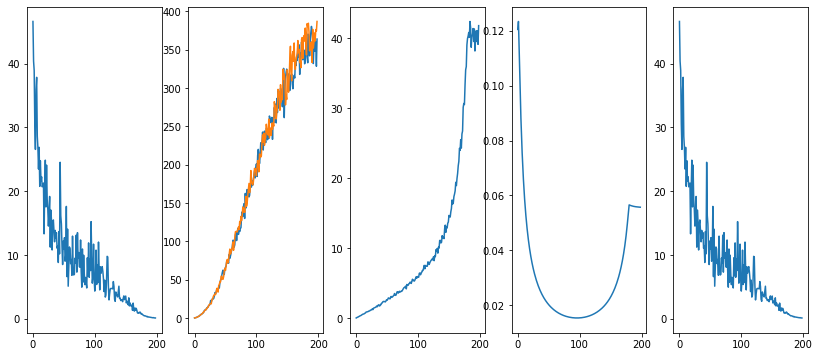

In [96]:
_, (plt1, plt2, plt3, plt4, plt5) = plt.subplots(1,5, figsize=(14, 6))

plt1.plot(loss_)
plt2.plot(huber_loss_)
plt3.plot(huber_loss_weighted)
plt4.plot(imp_weight_)
plt5.plot(model_huber_loss)

In [97]:
from copy import deepcopy
import pickle
import sys

batches_iter = 20000

def train_model(opt_state, params, avg_params, model_name, train_new_model=False, energy_method=False):
    best_loss = sys.float_info.max # initialization
    train = create_input_iter(train_ds)    

    if train_new_model or not os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        # generating sub keys for timesteps
        unique_key = jax.random.fold_in(key, batch_size)
        
        # same subkey being used for noise sampling, as it doesn't matter :)
        _, *timestep_subkeys = jax.random.split(unique_key, batches_iter+1)
        
        losses = []
        for iteration in range(0, batches_iter):
            data_in_batch, label = next(train)
            data_in_batch = data_in_batch[0]
            label = label[0]
            idx = (jax.random.uniform(key=timestep_subkeys[iteration], shape=(batch_size, 1)) * (timesteps-1)).astype(int)
            idx = einops.rearrange(idx, 'a b -> (a b)')
            timestep = idx + 1
            data_noisy, noise = get_noisy(timestep_subkeys[iteration], data_in_batch, timestep)
            # todo: call gradient update function here
            loss_value, params, opt_state = update(params, opt_state, [data_noisy, label, timestep, noise], energy_method)
            avg_params = ema_update(params, avg_params)
            
            if iteration % 10 == 0:
              print("batch loss value: ", loss_value)
            
            if iteration % 20 == 0:                
                ## evaluating noise on a fixed timestep to calculate best model
                one_timestep = jnp.mod(jnp.arange(1, batch_size+1), timesteps)
                data_noisy_temp, noise_temp = get_noisy(timestep_subkeys[iteration], data_in_batch, one_timestep)
                loss_temp = jax.device_get(compute_loss(avg_params, [data_noisy_temp, label, one_timestep, noise_temp], energy_method))
                losses.append(loss_temp)
            
                if loss_temp < best_loss:
                    best_loss = loss_temp
                    print(f"saving iteration: {iteration} loss: {best_loss:>7f}")
                    save(model_paths, avg_params, model_name)
                    write_cached([data_noisy, data_in_batch, timestep, losses], osp.join(data_paths, model_name + '_state.pt'))
            
                if iteration % 100 == 0:
                    print(f"iteration: {iteration} loss: {loss_temp:>7f}")
                    # sample a random number
                    r_ = (jax.random.uniform(timestep_subkeys[iteration])*batch_size).astype(int)
                    show_predicted_image(data_noisy_temp[r_: r_+1], avg_params, one_timestep[r_], label[r_: r_+1])

    if os.path.exists(osp.join(data_paths, model_name + '_state.pt')):
        avg_params = restore(model_paths, model_name)
        data_noisy, data_in_batch, timestep, losses = load_cached(osp.join(data_paths, model_name + '_state.pt')) 
    return data_noisy, data_in_batch, timestep, losses, avg_params

batch loss value:  5354.903
saving iteration: 0 loss: 22338.707031
iteration: 0 loss: 22338.707031
time step for image 19


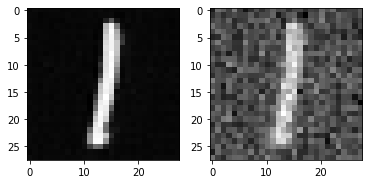

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6779.041
batch loss value:  6070.752
saving iteration: 20 loss: 6910.276367
batch loss value:  5756.5664
batch loss value:  5241.1514
saving iteration: 40 loss: 6203.374023
batch loss value:  5372.9473
batch loss value:  5500.798
saving iteration: 60 loss: 6091.078613
batch loss value:  4986.9385
batch loss value:  5043.3145
saving iteration: 80 loss: 5886.085938
batch loss value:  5143.717
batch loss value:  4926.0664
iteration: 100 loss: 6043.312500
time step for image 86


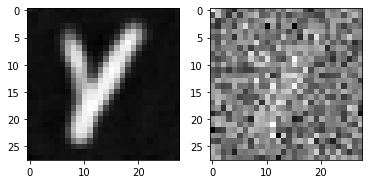

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5195.381
batch loss value:  5080.5156
batch loss value:  5494.466
batch loss value:  4901.2373
saving iteration: 140 loss: 5809.982422
batch loss value:  4922.593
batch loss value:  5902.9844
batch loss value:  5310.982
batch loss value:  4995.99
batch loss value:  5579.4404
batch loss value:  5569.352
iteration: 200 loss: 6103.928711
time step for image 193


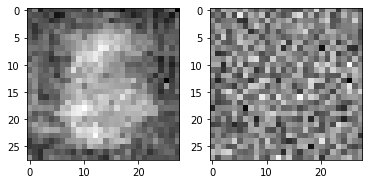

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5060.6436
batch loss value:  5257.3057
batch loss value:  5488.3535
batch loss value:  4769.7114
batch loss value:  5345.9253
batch loss value:  4628.023
batch loss value:  5209.287
batch loss value:  5568.552
batch loss value:  5032.749
batch loss value:  5278.323
iteration: 300 loss: 5887.551758
time step for image 56


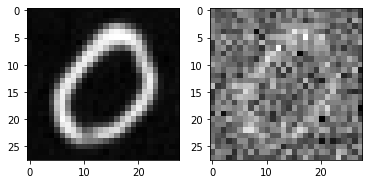

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  6125.958
batch loss value:  5352.1016
batch loss value:  5686.1353
batch loss value:  5384.243
batch loss value:  5066.8916
batch loss value:  5094.717
batch loss value:  5742.9043
batch loss value:  5209.677
batch loss value:  5301.125
batch loss value:  4901.133
iteration: 400 loss: 5970.624023
time step for image 154


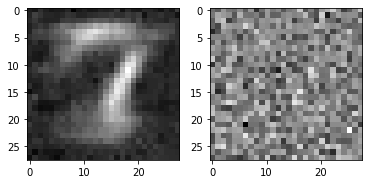

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5018.368
batch loss value:  5562.132
batch loss value:  6014.871
batch loss value:  4924.322
batch loss value:  5240.113
batch loss value:  5208.3804
batch loss value:  5417.338
batch loss value:  4920.258
batch loss value:  5239.5664
batch loss value:  5238.717
iteration: 500 loss: 5846.676758
time step for image 138


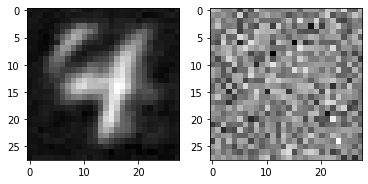

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5734.619
batch loss value:  4923.44
batch loss value:  5618.777
batch loss value:  5704.991
batch loss value:  5097.3906
batch loss value:  5206.5215
batch loss value:  5284.7017
batch loss value:  5780.085
batch loss value:  5348.1978
batch loss value:  4483.809
iteration: 600 loss: 5879.331543
time step for image 89


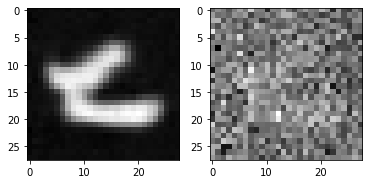

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5041.294
batch loss value:  4956.247
batch loss value:  4901.5107
batch loss value:  5135.247
saving iteration: 640 loss: 5789.909180
batch loss value:  5138.894
batch loss value:  5249.571
batch loss value:  5607.4966
batch loss value:  5135.421
batch loss value:  5068.3936
batch loss value:  5700.172
iteration: 700 loss: 6092.639160
time step for image 61


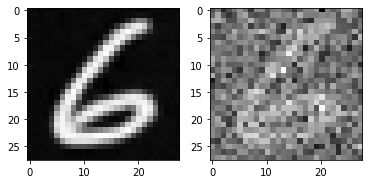

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5593.583
batch loss value:  5603.49
batch loss value:  5528.72
batch loss value:  5378.507
batch loss value:  5407.9375
batch loss value:  5363.5327
batch loss value:  5274.1406
batch loss value:  5437.5146
batch loss value:  5112.738
batch loss value:  4964.9243
iteration: 800 loss: 5993.217773
time step for image 92


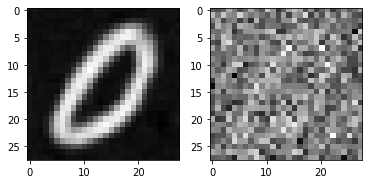

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5151.365
batch loss value:  5407.537
saving iteration: 820 loss: 5781.769531
batch loss value:  5521.699
batch loss value:  4573.3687
batch loss value:  5478.591
batch loss value:  5385.878
batch loss value:  5164.8604
batch loss value:  5075.9834
batch loss value:  5226.076
batch loss value:  5034.092
saving iteration: 900 loss: 5757.909668
iteration: 900 loss: 5757.909668
time step for image 176


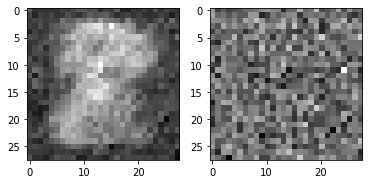

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5262.051
batch loss value:  5434.824
batch loss value:  4979.9126
batch loss value:  5445.9814
batch loss value:  5201.618
batch loss value:  5526.2686
batch loss value:  5085.6987
batch loss value:  4888.55
batch loss value:  5395.1533
batch loss value:  5336.0107
iteration: 1000 loss: 5900.198242
time step for image 58


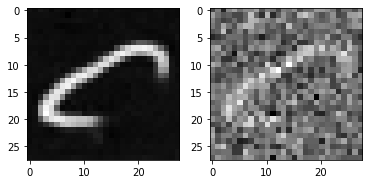

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5313.247
batch loss value:  4998.217
batch loss value:  5055.9795
batch loss value:  4897.5376
batch loss value:  5242.8877
batch loss value:  4778.658
batch loss value:  5114.1396
batch loss value:  5513.6045
batch loss value:  4894.6133
batch loss value:  5239.1807
iteration: 1100 loss: 6083.625000
time step for image 59


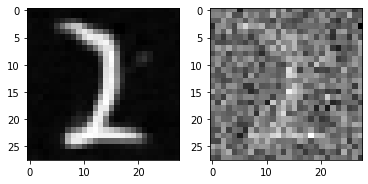

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5400.9067
batch loss value:  4921.5205
batch loss value:  5367.6953
batch loss value:  5291.427
batch loss value:  4756.9165
batch loss value:  5181.5537
saving iteration: 1160 loss: 5661.308594
batch loss value:  5633.0356
batch loss value:  5358.538
batch loss value:  5293.0596
batch loss value:  5484.997
iteration: 1200 loss: 6045.532227
time step for image 158


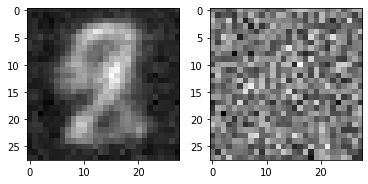

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5204.2837
batch loss value:  5065.374
batch loss value:  4907.914
batch loss value:  5026.076
batch loss value:  5124.932
batch loss value:  5048.811
batch loss value:  5031.53
batch loss value:  5238.4634
batch loss value:  4904.382
batch loss value:  5056.5723
iteration: 1300 loss: 5902.496094
time step for image 71


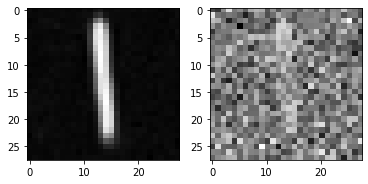

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5147.0264
batch loss value:  4528.2173
batch loss value:  5027.2803
batch loss value:  5370.5234
batch loss value:  5285.968
batch loss value:  5122.1357
batch loss value:  5470.698
batch loss value:  5351.59
batch loss value:  4965.964
batch loss value:  4898.221
iteration: 1400 loss: 5747.453125
time step for image 29


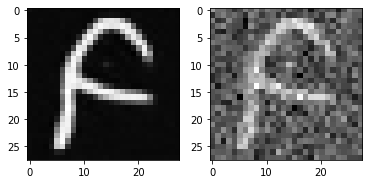

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5224.5605
batch loss value:  5012.181
batch loss value:  4723.0156
batch loss value:  5057.9893
batch loss value:  6106.3545
batch loss value:  5160.122
batch loss value:  5603.722
batch loss value:  4941.8545
batch loss value:  5181.3184
batch loss value:  5143.9434
saving iteration: 1500 loss: 5624.714844
iteration: 1500 loss: 5624.714844
time step for image 52


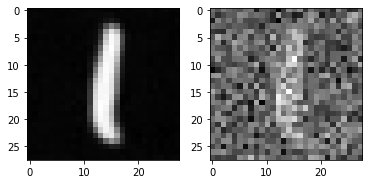

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5318.6357
batch loss value:  4529.0405
batch loss value:  5102.4424
batch loss value:  4985.0967
batch loss value:  5315.6816
batch loss value:  5166.255
batch loss value:  5639.2417
batch loss value:  5079.44
batch loss value:  5740.1904
batch loss value:  4958.6953
iteration: 1600 loss: 5797.557617
time step for image 22


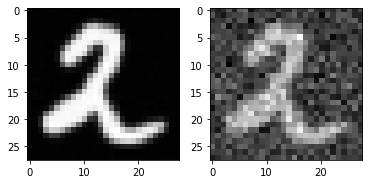

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5131.7314
batch loss value:  5063.622
batch loss value:  4935.3125
batch loss value:  4654.0146
batch loss value:  5252.8564
batch loss value:  4601.954
batch loss value:  4728.1904
batch loss value:  5623.547
batch loss value:  5384.0
batch loss value:  5367.6055
iteration: 1700 loss: 5865.677734
time step for image 94


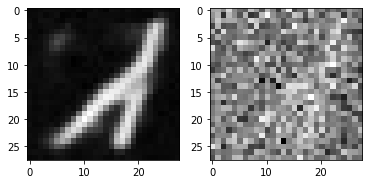

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4844.2773
batch loss value:  5380.735
batch loss value:  5165.2573
batch loss value:  4983.354
batch loss value:  5414.805
batch loss value:  4939.6294
batch loss value:  4755.1455
batch loss value:  5225.673
batch loss value:  5467.0996
batch loss value:  5343.881
iteration: 1800 loss: 5923.765137
time step for image 116


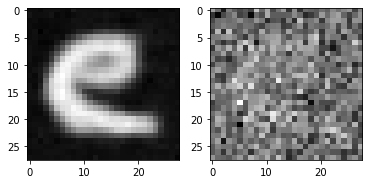

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4952.3843
batch loss value:  5120.1265
batch loss value:  5534.489
batch loss value:  4939.88
batch loss value:  4847.134
batch loss value:  5302.879
batch loss value:  4890.1
batch loss value:  5069.2725
batch loss value:  5038.94
batch loss value:  5323.436
iteration: 1900 loss: 5867.630859
time step for image 75


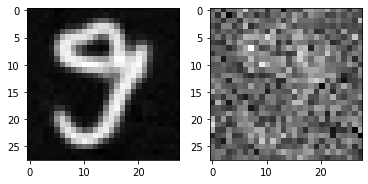

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4909.556
batch loss value:  4937.9336
batch loss value:  4844.7544
batch loss value:  5301.3945
batch loss value:  4945.673
batch loss value:  5552.05
batch loss value:  4858.6797
batch loss value:  5206.45
batch loss value:  5144.2524
batch loss value:  4817.924
iteration: 2000 loss: 5830.230469
time step for image 158


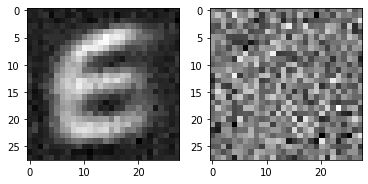

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4960.448
batch loss value:  5351.912
saving iteration: 2020 loss: 5544.424316
batch loss value:  5593.093
batch loss value:  5393.4814
batch loss value:  4828.1353
batch loss value:  5570.3555
batch loss value:  5238.419
batch loss value:  4983.6797
batch loss value:  4971.4463
batch loss value:  5398.897
iteration: 2100 loss: 5647.027344
time step for image 15


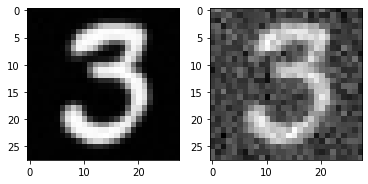

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4763.6904
batch loss value:  4940.007
batch loss value:  5325.8457
batch loss value:  5268.799
batch loss value:  5197.172
batch loss value:  5109.6514
batch loss value:  5083.8247
batch loss value:  5012.454
batch loss value:  5022.998
batch loss value:  4652.173
iteration: 2200 loss: 5685.948242
time step for image 142


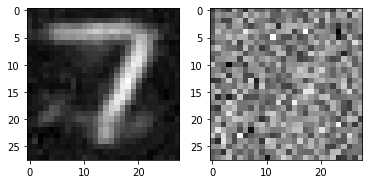

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4735.3945
batch loss value:  4736.874
batch loss value:  5045.9697
batch loss value:  5232.505
batch loss value:  5431.0283
batch loss value:  4942.8926
batch loss value:  4901.1543
batch loss value:  5295.9834
batch loss value:  5321.248
batch loss value:  5199.379
iteration: 2300 loss: 5892.914551
time step for image 130


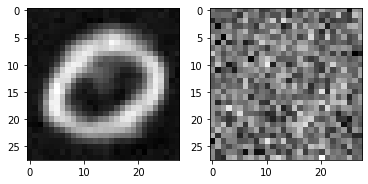

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5057.672
batch loss value:  5093.01
batch loss value:  5071.9883
batch loss value:  5268.681
batch loss value:  5003.3945
batch loss value:  4998.3228
batch loss value:  5422.181
batch loss value:  5182.364
batch loss value:  5185.506
batch loss value:  5411.421
iteration: 2400 loss: 5756.245117
time step for image 173


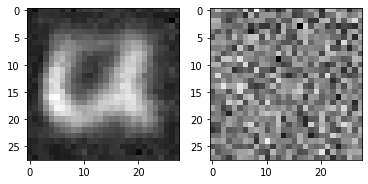

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4946.1025
batch loss value:  4857.369
batch loss value:  4495.266
batch loss value:  5380.2827
batch loss value:  4961.8276
batch loss value:  4740.215
batch loss value:  4911.8164
batch loss value:  5186.2866
batch loss value:  5043.4707
batch loss value:  5267.1875
saving iteration: 2500 loss: 5536.352539
iteration: 2500 loss: 5536.352539
time step for image 140


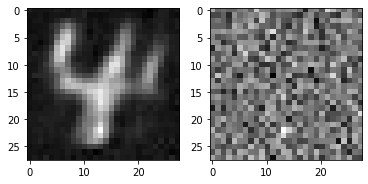

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5163.604
batch loss value:  4859.39
batch loss value:  4755.283
batch loss value:  4944.8525
batch loss value:  5552.4995
batch loss value:  4949.962
batch loss value:  5046.7236
batch loss value:  4942.2363
batch loss value:  5252.678
batch loss value:  5087.2773
iteration: 2600 loss: 5886.648438
time step for image 53


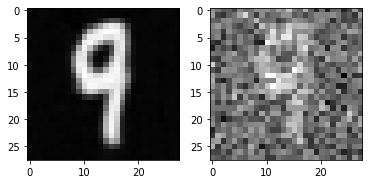

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5389.9766
batch loss value:  5245.3647
batch loss value:  5154.815
batch loss value:  5213.8965
batch loss value:  5194.1167
batch loss value:  4956.038
batch loss value:  4725.998
batch loss value:  5012.4717
batch loss value:  5074.16
batch loss value:  4774.8755
iteration: 2700 loss: 5790.692871
time step for image 146


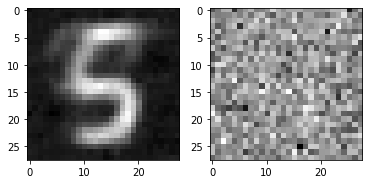

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5055.0117
batch loss value:  5438.85
batch loss value:  5209.296
batch loss value:  4989.152
batch loss value:  5093.284
batch loss value:  4595.7754
batch loss value:  5085.33
batch loss value:  5397.4814
batch loss value:  5236.289
batch loss value:  5152.279
iteration: 2800 loss: 5821.651367
time step for image 15


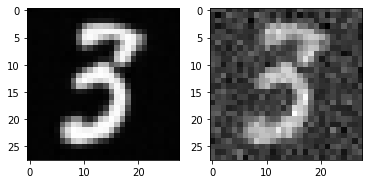

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5174.7656
batch loss value:  5164.5215
batch loss value:  5308.3013
batch loss value:  4890.2627
batch loss value:  5077.9795
batch loss value:  4886.9473
batch loss value:  4851.5303
batch loss value:  5035.8423
batch loss value:  5183.2856
batch loss value:  5119.128
iteration: 2900 loss: 5884.083008
time step for image 181


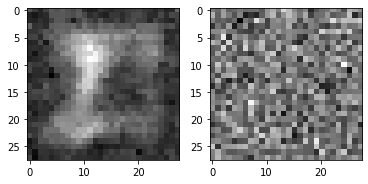

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5013.1846
batch loss value:  4941.584
batch loss value:  5011.164
batch loss value:  5086.8433
batch loss value:  5022.6504
batch loss value:  5090.3037
batch loss value:  4800.05
batch loss value:  5087.2393
batch loss value:  5357.3257
batch loss value:  5083.1665
iteration: 3000 loss: 5794.900391
time step for image 3


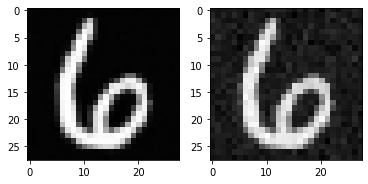

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4911.075
batch loss value:  4945.4014
saving iteration: 3020 loss: 5520.579590
batch loss value:  4943.3
batch loss value:  4932.1475
batch loss value:  4879.122
batch loss value:  5048.421
batch loss value:  5440.02
batch loss value:  5053.376
batch loss value:  4681.0356
batch loss value:  5078.649
iteration: 3100 loss: 5645.208008
time step for image 13


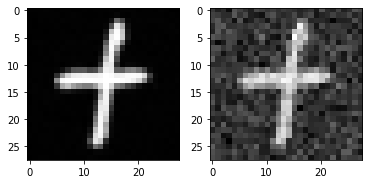

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4604.2256
batch loss value:  5183.3047
batch loss value:  5077.2764
batch loss value:  4937.9414
batch loss value:  5024.924
batch loss value:  5324.881
batch loss value:  5075.2607
batch loss value:  4941.018
batch loss value:  5129.0137
batch loss value:  4988.865
iteration: 3200 loss: 5751.246094
time step for image 178


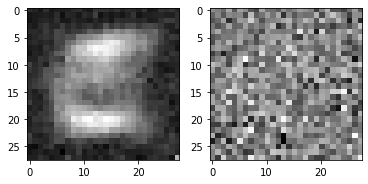

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5212.5796
batch loss value:  4719.3086
batch loss value:  4964.6733
batch loss value:  4904.825
saving iteration: 3240 loss: 5505.181641
batch loss value:  4730.6636
batch loss value:  4848.859
batch loss value:  4673.626
batch loss value:  4507.871
batch loss value:  5818.9834
batch loss value:  4884.153
iteration: 3300 loss: 5687.916992
time step for image 112


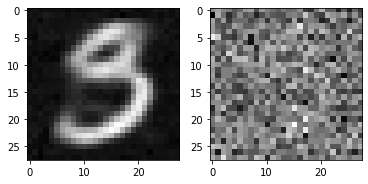

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5076.997
batch loss value:  4809.739
batch loss value:  4864.7705
batch loss value:  4767.667
batch loss value:  4812.957
batch loss value:  5399.454
batch loss value:  5300.7446
batch loss value:  4952.1675
batch loss value:  5236.4326
batch loss value:  5253.521
iteration: 3400 loss: 5848.746094
time step for image 100


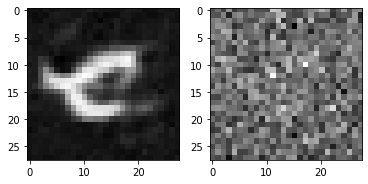

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5061.859
batch loss value:  5059.899
batch loss value:  4946.981
batch loss value:  4937.132
batch loss value:  5342.1914
batch loss value:  5111.7
batch loss value:  4830.4766
batch loss value:  4698.0874
batch loss value:  5521.1313
batch loss value:  5076.4805
iteration: 3500 loss: 5706.624023
time step for image 75


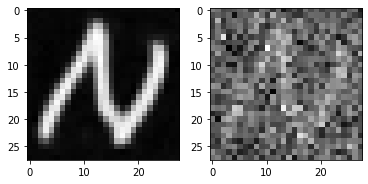

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4845.4683
batch loss value:  4756.041
saving iteration: 3520 loss: 5500.097656
batch loss value:  5053.307
batch loss value:  4880.779
saving iteration: 3540 loss: 5430.614258
batch loss value:  5061.326
batch loss value:  5562.1396
batch loss value:  4871.5015
batch loss value:  5772.59
batch loss value:  4813.7935
batch loss value:  4854.627
iteration: 3600 loss: 5753.842773
time step for image 6


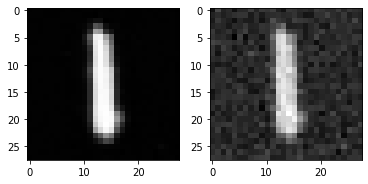

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4784.836
batch loss value:  4970.2207
batch loss value:  4871.883
batch loss value:  5305.2104
batch loss value:  4947.4595
batch loss value:  5092.0684
batch loss value:  4941.1104
batch loss value:  5217.338
batch loss value:  4931.324
batch loss value:  4779.83
iteration: 3700 loss: 5633.260742
time step for image 79


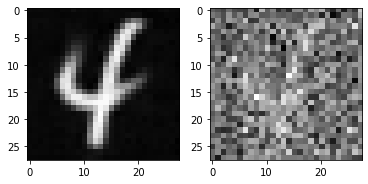

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4872.5894
batch loss value:  4956.4023
batch loss value:  4588.899
batch loss value:  5012.45
batch loss value:  5185.4863
batch loss value:  4761.753
batch loss value:  4670.4297
batch loss value:  5469.0703
batch loss value:  4768.841
batch loss value:  5148.678
iteration: 3800 loss: 5648.643555
time step for image 74


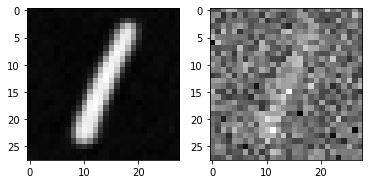

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4986.54
batch loss value:  4972.7847
batch loss value:  5254.2295
batch loss value:  4895.457
batch loss value:  4677.324
batch loss value:  5039.8193
batch loss value:  5077.748
batch loss value:  4810.04
batch loss value:  5005.8677
batch loss value:  5084.6816
iteration: 3900 loss: 5795.490234
time step for image 194


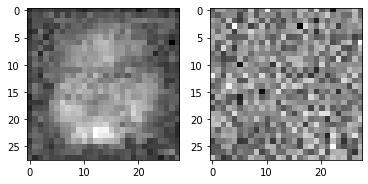

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5186.163
batch loss value:  4861.394
batch loss value:  4833.035
batch loss value:  4918.6475
batch loss value:  5073.122
batch loss value:  5404.6797
batch loss value:  5060.649
batch loss value:  4767.8003
batch loss value:  4663.5347
batch loss value:  4881.633
iteration: 4000 loss: 5971.187500
time step for image 163


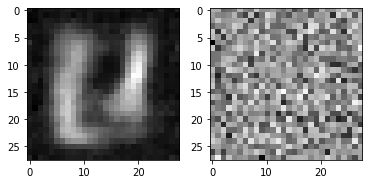

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5514.842
batch loss value:  4774.0205
batch loss value:  4745.6997
batch loss value:  4673.356
saving iteration: 4040 loss: 5423.047363
batch loss value:  5307.8394
batch loss value:  4550.4062
batch loss value:  4918.337
batch loss value:  5143.1387
batch loss value:  4879.708
batch loss value:  5171.9697
iteration: 4100 loss: 5862.975098
time step for image 37


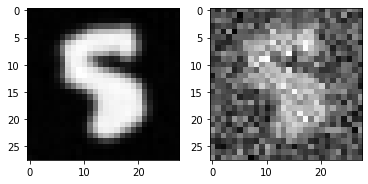

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5194.699
batch loss value:  4814.1533
batch loss value:  4305.993
batch loss value:  4918.746
batch loss value:  4885.123
batch loss value:  4654.8794
batch loss value:  4777.6914
batch loss value:  4511.406
batch loss value:  4554.843
batch loss value:  4971.262
iteration: 4200 loss: 5510.305664
time step for image 0


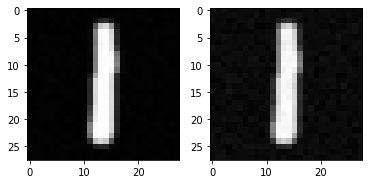

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5547.968
batch loss value:  5236.167
batch loss value:  5330.482
batch loss value:  4967.549
batch loss value:  4996.667
batch loss value:  4959.4883
batch loss value:  5104.8906
batch loss value:  5166.541
batch loss value:  4875.133
batch loss value:  5097.3623
iteration: 4300 loss: 5701.205078
time step for image 101


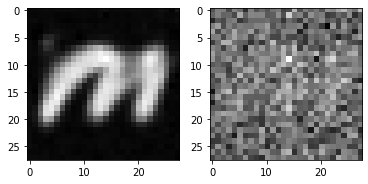

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5277.723
batch loss value:  4900.516
batch loss value:  5040.2324
batch loss value:  5212.7915
batch loss value:  5102.525
batch loss value:  5080.123
batch loss value:  5078.289
batch loss value:  5235.023
batch loss value:  4772.788
batch loss value:  4848.645
iteration: 4400 loss: 5813.637695
time step for image 108


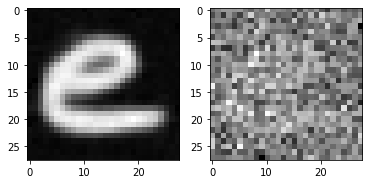

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4884.925
batch loss value:  4781.4033
batch loss value:  4662.5596
batch loss value:  5211.2144
batch loss value:  5261.3823
batch loss value:  5051.57
batch loss value:  5076.1367
batch loss value:  5158.4863
batch loss value:  5245.864
batch loss value:  5073.2915
iteration: 4500 loss: 5601.901367
time step for image 88


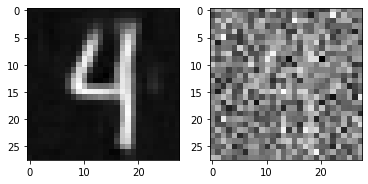

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5233.6377
batch loss value:  4552.6836
batch loss value:  5282.489
batch loss value:  5093.233
batch loss value:  5486.953
batch loss value:  4696.367
batch loss value:  4796.6934
batch loss value:  4929.267
batch loss value:  4965.8276
batch loss value:  5180.696
iteration: 4600 loss: 5881.902832
time step for image 66


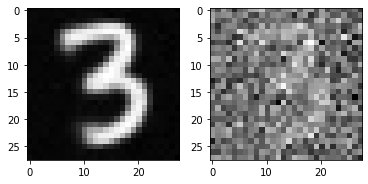

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4661.0747
batch loss value:  4895.01
batch loss value:  4697.6084
batch loss value:  5109.0527
batch loss value:  4901.802
batch loss value:  4884.1846
batch loss value:  5176.372
batch loss value:  5464.9185
batch loss value:  4732.875
batch loss value:  4904.354
iteration: 4700 loss: 5901.841797
time step for image 98


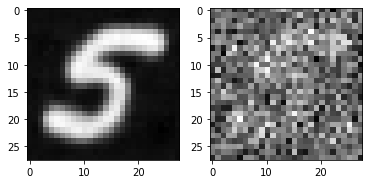

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5095.4453
batch loss value:  5276.1865
batch loss value:  5009.7744
batch loss value:  4606.222
batch loss value:  4997.6787
batch loss value:  4662.377
batch loss value:  4625.332
batch loss value:  5132.917
batch loss value:  5115.202
batch loss value:  5382.253
iteration: 4800 loss: 5686.546875
time step for image 107


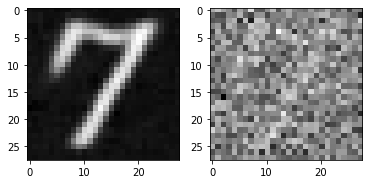

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4863.9395
batch loss value:  4877.5967
batch loss value:  4921.672
batch loss value:  5023.998
batch loss value:  5423.4385
batch loss value:  4892.788
batch loss value:  4768.1494
batch loss value:  4642.2246
batch loss value:  4890.142
batch loss value:  5038.1074
iteration: 4900 loss: 5769.548828
time step for image 82


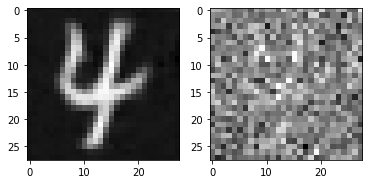

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5089.083
batch loss value:  5395.263
batch loss value:  5048.416
batch loss value:  4691.505
batch loss value:  4526.418
batch loss value:  4978.2793
batch loss value:  4718.9546
batch loss value:  4966.633
batch loss value:  5087.119
batch loss value:  4740.1387
iteration: 5000 loss: 5788.061523
time step for image 55


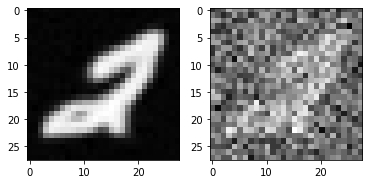

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4960.3945
batch loss value:  4779.3867
batch loss value:  4980.1426
batch loss value:  4884.3423
batch loss value:  5315.4424
batch loss value:  5172.4043
batch loss value:  4994.583
batch loss value:  4953.59
batch loss value:  5035.8564
batch loss value:  5131.911
iteration: 5100 loss: 5661.256348
time step for image 127


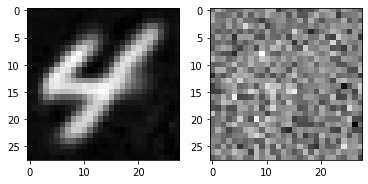

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4877.436
batch loss value:  4542.795
batch loss value:  4793.8086
batch loss value:  4926.2036
batch loss value:  4633.8525
batch loss value:  4734.838
batch loss value:  5206.3433
batch loss value:  4170.009
batch loss value:  5046.862
batch loss value:  5108.5405
iteration: 5200 loss: 5745.675781
time step for image 14


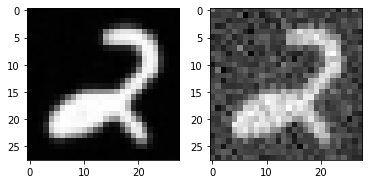

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5330.8223
batch loss value:  5039.07
batch loss value:  4817.2397
batch loss value:  4893.1313
batch loss value:  5398.5244
batch loss value:  5376.325
batch loss value:  4773.4746
batch loss value:  4957.521
batch loss value:  5026.661
batch loss value:  4783.597
iteration: 5300 loss: 5716.831055
time step for image 36


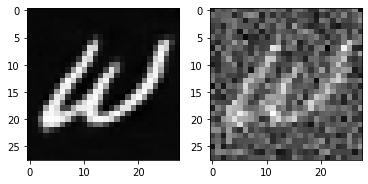

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4814.9087
batch loss value:  5128.7183
batch loss value:  4611.9556
batch loss value:  4919.5586
batch loss value:  4659.912
batch loss value:  5032.366
batch loss value:  5428.635
batch loss value:  5368.5557
batch loss value:  4735.1206
batch loss value:  4721.1797
iteration: 5400 loss: 5541.310547
time step for image 130


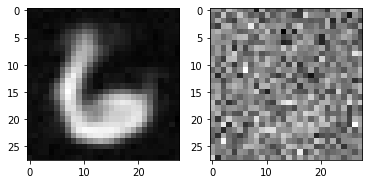

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5053.6543
batch loss value:  5019.795
batch loss value:  5368.086
batch loss value:  4998.918
batch loss value:  4681.8594
batch loss value:  5151.757
batch loss value:  4998.331
batch loss value:  4959.2793
batch loss value:  5206.9893
batch loss value:  5175.615
iteration: 5500 loss: 5587.518066
time step for image 83


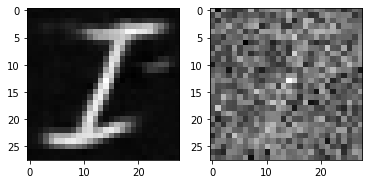

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4816.9355
batch loss value:  4990.4595
batch loss value:  4849.3477
batch loss value:  4689.244
saving iteration: 5540 loss: 5369.530762
batch loss value:  5150.01
batch loss value:  4827.892
batch loss value:  4790.2046
batch loss value:  5204.072
batch loss value:  4624.586
batch loss value:  4983.907
iteration: 5600 loss: 5656.319336
time step for image 7


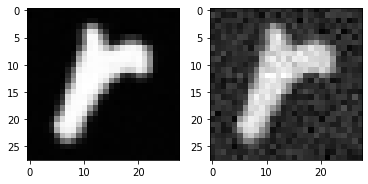

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4673.423
batch loss value:  5508.497
batch loss value:  4789.7646
batch loss value:  4998.3467
batch loss value:  5253.4414
batch loss value:  5063.2993
batch loss value:  4995.406
batch loss value:  4659.3716
batch loss value:  4761.66
batch loss value:  5123.203
iteration: 5700 loss: 5491.230469
time step for image 24


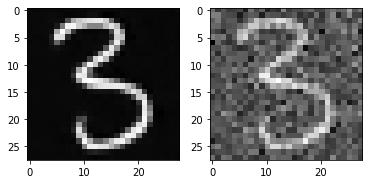

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4841.7407
batch loss value:  5124.929
batch loss value:  4882.468
batch loss value:  5221.7964
batch loss value:  5157.1157
batch loss value:  5249.916
batch loss value:  4329.097
batch loss value:  4520.0005
batch loss value:  4501.1875
batch loss value:  4656.798
iteration: 5800 loss: 5685.784180
time step for image 155


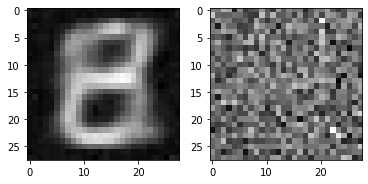

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4934.444
batch loss value:  5344.466
batch loss value:  5046.095
batch loss value:  4634.9727
batch loss value:  5134.6294
batch loss value:  4215.445
batch loss value:  4954.9863
batch loss value:  4782.1035
batch loss value:  4561.1724
batch loss value:  5106.23
iteration: 5900 loss: 5777.448242
time step for image 32


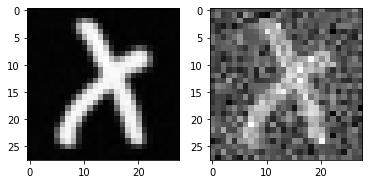

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4583.0127
batch loss value:  5032.904
batch loss value:  5096.533
batch loss value:  4925.31
batch loss value:  5202.8145
batch loss value:  5289.326
batch loss value:  4909.282
batch loss value:  4774.399
batch loss value:  4844.2324
batch loss value:  5210.006
iteration: 6000 loss: 5791.330566
time step for image 45


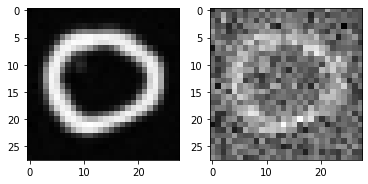

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5054.653
batch loss value:  4725.9194
batch loss value:  4480.444
batch loss value:  5304.0957
batch loss value:  4634.2183
batch loss value:  4559.69
saving iteration: 6060 loss: 5366.286621
batch loss value:  4890.9116
batch loss value:  4573.16
batch loss value:  5030.915
batch loss value:  5290.8804
iteration: 6100 loss: 5713.640625
time step for image 68


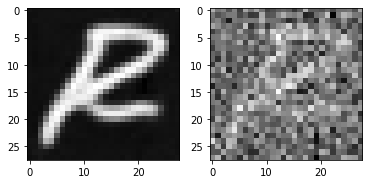

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4872.4243
batch loss value:  4776.25
batch loss value:  5108.4185
batch loss value:  4817.3887
batch loss value:  5111.4175
batch loss value:  4694.913
saving iteration: 6160 loss: 5354.030273
batch loss value:  4618.2124
batch loss value:  4741.015
batch loss value:  4657.494
batch loss value:  4805.1953
iteration: 6200 loss: 5704.360840
time step for image 114


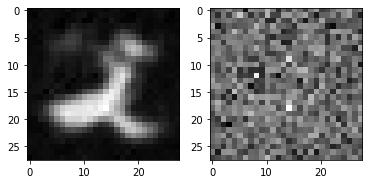

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4695.5693
batch loss value:  4840.318
batch loss value:  4829.912
batch loss value:  4702.0566
batch loss value:  4899.0366
batch loss value:  4607.0776
batch loss value:  5404.3027
batch loss value:  4860.512
batch loss value:  4892.5713
batch loss value:  4607.579
iteration: 6300 loss: 5371.782715
time step for image 58


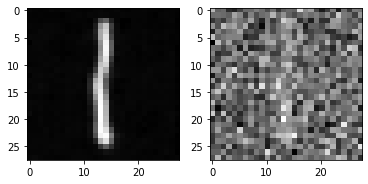

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4467.4653
batch loss value:  4831.282
batch loss value:  4918.3423
batch loss value:  4909.0684
batch loss value:  4963.1406
batch loss value:  5065.913
batch loss value:  4826.2554
batch loss value:  4872.8438
batch loss value:  4709.217
batch loss value:  4943.3438
iteration: 6400 loss: 5435.037598
time step for image 61


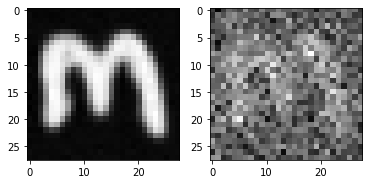

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5271.8037
batch loss value:  4872.342
batch loss value:  4717.539
batch loss value:  4486.986
batch loss value:  4899.8193
batch loss value:  4327.1787
batch loss value:  5032.6626
batch loss value:  4885.208
saving iteration: 6480 loss: 5333.930176
batch loss value:  4860.3145
batch loss value:  4997.1147
iteration: 6500 loss: 5660.470703
time step for image 98


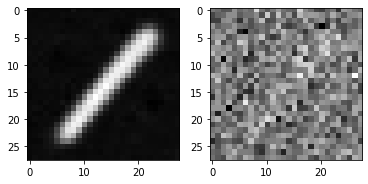

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4750.158
batch loss value:  5045.168
batch loss value:  4810.808
batch loss value:  4691.9253
batch loss value:  4927.424
batch loss value:  4907.166
batch loss value:  4947.123
batch loss value:  4871.9624
batch loss value:  5357.2114
batch loss value:  5461.6094
iteration: 6600 loss: 5465.798828
time step for image 36


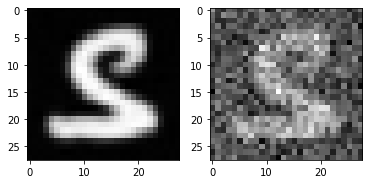

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5449.4985
batch loss value:  4864.3774
batch loss value:  4923.4434
batch loss value:  4480.016
batch loss value:  4558.693
batch loss value:  4535.975
batch loss value:  4744.2974
batch loss value:  5212.126
batch loss value:  4842.082
batch loss value:  4688.8564
iteration: 6700 loss: 5467.438477
time step for image 15


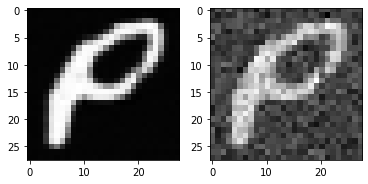

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4507.826
batch loss value:  4867.0967
batch loss value:  4830.6914
batch loss value:  4831.1045
batch loss value:  4910.349
batch loss value:  4864.492
batch loss value:  5053.8633
batch loss value:  4610.7812
batch loss value:  5225.176
batch loss value:  4836.5615
iteration: 6800 loss: 5571.412109
time step for image 107


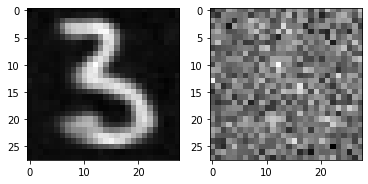

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5151.235
batch loss value:  5095.8228
batch loss value:  4956.876
batch loss value:  4998.2666
batch loss value:  4985.6475
batch loss value:  5295.9697
batch loss value:  5251.2695
batch loss value:  5065.3975
batch loss value:  5047.3115
batch loss value:  5138.1704
iteration: 6900 loss: 5646.003906
time step for image 132


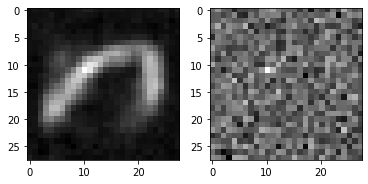

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5040.78
batch loss value:  4745.01
batch loss value:  4932.111
batch loss value:  4980.0864
saving iteration: 6940 loss: 5267.196289
batch loss value:  4518.885
batch loss value:  4616.2236
batch loss value:  5030.547
batch loss value:  5252.166
batch loss value:  4887.3447
batch loss value:  4852.87
iteration: 7000 loss: 5630.980957
time step for image 112


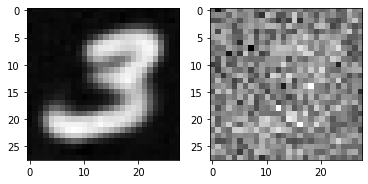

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4496.5107
batch loss value:  5351.3774
batch loss value:  4741.8457
batch loss value:  4905.4863
batch loss value:  4722.2134
batch loss value:  5080.4746
batch loss value:  4836.2305
batch loss value:  5161.507
batch loss value:  4506.877
batch loss value:  4641.3057
iteration: 7100 loss: 5643.576172
time step for image 174


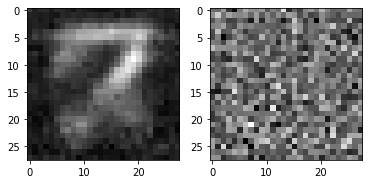

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4815.074
batch loss value:  5268.189
batch loss value:  4906.007
batch loss value:  4727.299
batch loss value:  4907.878
batch loss value:  5082.5205
batch loss value:  4648.6543
batch loss value:  4963.944
batch loss value:  5014.891
batch loss value:  5005.7236
iteration: 7200 loss: 5425.150391
time step for image 184


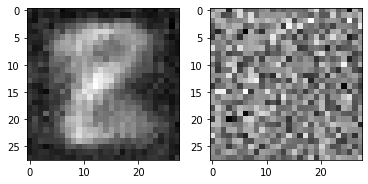

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4768.635
batch loss value:  4790.033
batch loss value:  4925.4297
batch loss value:  5028.9053
batch loss value:  4841.202
batch loss value:  5044.541
batch loss value:  4898.297
batch loss value:  5080.494
batch loss value:  4835.9287
batch loss value:  4819.1416
iteration: 7300 loss: 5507.033203
time step for image 104


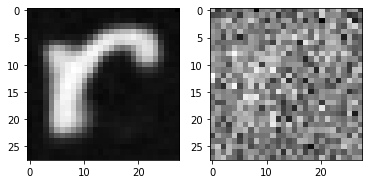

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4776.3154
batch loss value:  5230.6997
batch loss value:  4761.366
batch loss value:  4970.8965
batch loss value:  4963.006
batch loss value:  4840.9473
batch loss value:  4821.5537
batch loss value:  5061.7593
batch loss value:  4859.2715
batch loss value:  5343.6953
iteration: 7400 loss: 5625.370117
time step for image 33


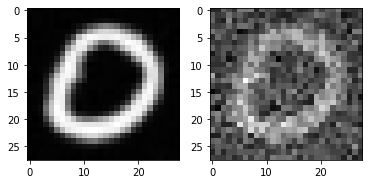

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4828.223
batch loss value:  4845.259
batch loss value:  4787.7354
batch loss value:  4738.5547
batch loss value:  5043.1035
batch loss value:  4971.463
batch loss value:  4756.222
batch loss value:  4834.9404
batch loss value:  4256.9585
batch loss value:  4532.043
iteration: 7500 loss: 5429.158203
time step for image 113


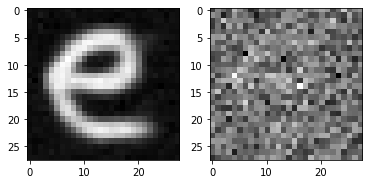

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4849.087
batch loss value:  5302.1787
batch loss value:  4811.667
batch loss value:  5113.803
batch loss value:  4835.655
batch loss value:  4532.036
batch loss value:  4832.029
batch loss value:  4891.3506
batch loss value:  4821.888
batch loss value:  4939.0063
iteration: 7600 loss: 5562.655273
time step for image 131


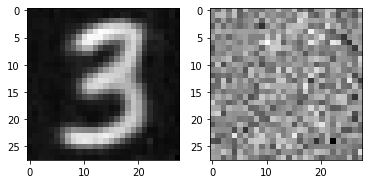

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5493.754
batch loss value:  5247.451
batch loss value:  5026.8096
batch loss value:  4774.389
batch loss value:  4444.642
batch loss value:  4965.078
batch loss value:  4740.2515
batch loss value:  5010.8955
batch loss value:  4923.287
batch loss value:  4736.258
iteration: 7700 loss: 5577.597656
time step for image 165


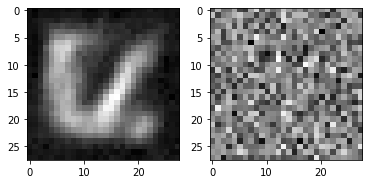

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5056.454
batch loss value:  4800.828
batch loss value:  4897.7056
batch loss value:  5039.4116
batch loss value:  4861.7
batch loss value:  4430.2124
batch loss value:  4690.5654
batch loss value:  5500.2363
batch loss value:  5171.336
batch loss value:  5200.145
iteration: 7800 loss: 5640.356934
time step for image 57


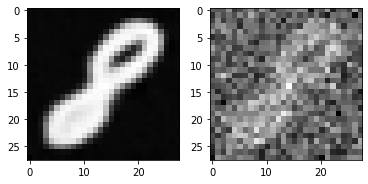

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5085.2217
batch loss value:  4818.104
batch loss value:  4620.6196
batch loss value:  5270.9395
batch loss value:  4720.7236
batch loss value:  4722.6416
batch loss value:  4951.4067
batch loss value:  5038.71
batch loss value:  5133.2144
batch loss value:  5218.9395
iteration: 7900 loss: 5571.629395
time step for image 68


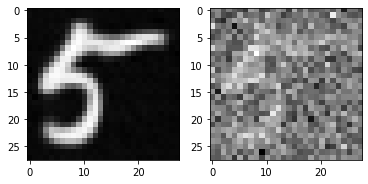

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4504.2373
batch loss value:  5105.7
batch loss value:  4789.749
batch loss value:  5052.826
batch loss value:  5028.0303
batch loss value:  4831.0195
batch loss value:  4891.031
batch loss value:  5147.8955
batch loss value:  4885.086
batch loss value:  4657.917
iteration: 8000 loss: 5304.046875
time step for image 17


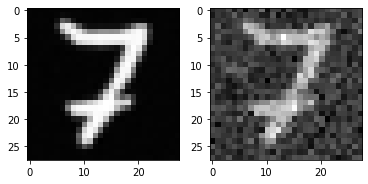

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4674.3037
batch loss value:  4820.4424
batch loss value:  5020.588
batch loss value:  5076.568
batch loss value:  4793.847
batch loss value:  5141.213
batch loss value:  4485.578
batch loss value:  4694.424
batch loss value:  5273.4736
batch loss value:  4679.9727
iteration: 8100 loss: 5427.886719
time step for image 36


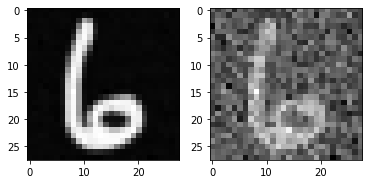

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4532.2393
batch loss value:  4786.5566
batch loss value:  4882.7695
batch loss value:  4831.442
batch loss value:  4876.536
batch loss value:  4863.724
batch loss value:  4698.756
batch loss value:  4583.8525
batch loss value:  4914.1855
batch loss value:  5005.8267
iteration: 8200 loss: 5547.103027
time step for image 67


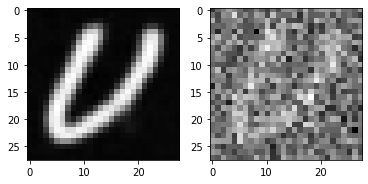

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4623.828
batch loss value:  4724.6733
batch loss value:  4679.412
batch loss value:  4767.165
batch loss value:  4678.937
batch loss value:  5025.8843
batch loss value:  4709.0264
batch loss value:  4821.8813
batch loss value:  5057.043
batch loss value:  4431.1646
iteration: 8300 loss: 5578.262695
time step for image 122


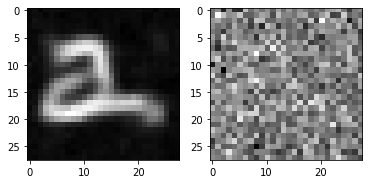

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5076.5996
batch loss value:  5257.857
batch loss value:  4828.924
batch loss value:  4880.8857
batch loss value:  4913.256
batch loss value:  4904.287
batch loss value:  4338.6113
batch loss value:  4922.9204
batch loss value:  4323.8066
batch loss value:  4817.764
iteration: 8400 loss: 5686.486328
time step for image 98


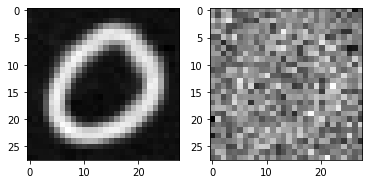

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5040.8433
batch loss value:  4875.2744
batch loss value:  4663.4326
batch loss value:  4661.6333
batch loss value:  5357.4727
batch loss value:  4621.53
batch loss value:  5048.9487
batch loss value:  5078.2256
batch loss value:  5140.533
batch loss value:  4519.8213
iteration: 8500 loss: 5402.111328
time step for image 61


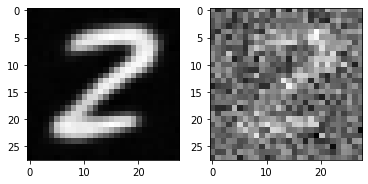

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4725.6333
batch loss value:  4937.4854
batch loss value:  5101.9424
batch loss value:  4903.524
batch loss value:  4569.5146
batch loss value:  4608.1025
batch loss value:  4546.6685
batch loss value:  5147.33
batch loss value:  4748.705
batch loss value:  5291.749
iteration: 8600 loss: 5459.997559
time step for image 46


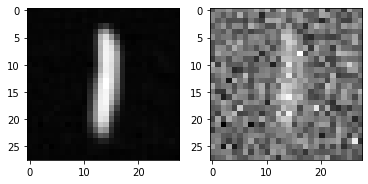

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4865.642
batch loss value:  4836.993
batch loss value:  4860.751
batch loss value:  4956.3154
batch loss value:  5113.495
batch loss value:  5553.258
batch loss value:  4267.8213
batch loss value:  4971.5005
batch loss value:  5118.4346
batch loss value:  4500.213
saving iteration: 8700 loss: 5229.229492
iteration: 8700 loss: 5229.229492
time step for image 54


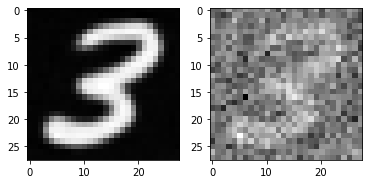

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5338.6035
batch loss value:  4945.378
batch loss value:  5128.831
batch loss value:  4717.6562
batch loss value:  4461.6016
batch loss value:  4849.3457
batch loss value:  4744.87
batch loss value:  4566.503
batch loss value:  5243.164
batch loss value:  4831.86
iteration: 8800 loss: 5494.705078
time step for image 139


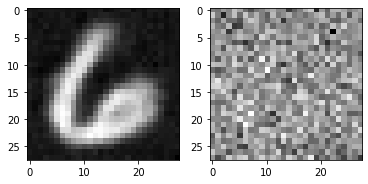

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4571.6543
batch loss value:  4944.9395
batch loss value:  4589.6143
batch loss value:  4800.1904
batch loss value:  4762.9326
batch loss value:  4733.5938
batch loss value:  4745.292
batch loss value:  4295.6025
batch loss value:  4722.879
batch loss value:  4872.181
iteration: 8900 loss: 5615.187988
time step for image 185


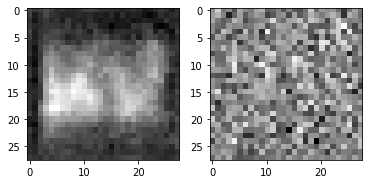

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4566.2188
batch loss value:  4480.1084
batch loss value:  5424.4307
batch loss value:  4862.9253
batch loss value:  4788.5786
batch loss value:  4633.185
batch loss value:  5030.126
batch loss value:  4600.153
batch loss value:  4370.04
batch loss value:  4579.2446
iteration: 9000 loss: 5487.152832
time step for image 153


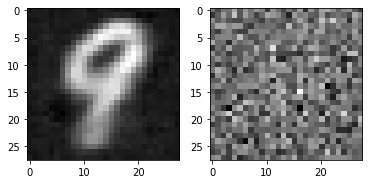

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4988.6504
batch loss value:  4479.3047
batch loss value:  4708.617
batch loss value:  4700.685
batch loss value:  4907.3984
batch loss value:  4692.968
batch loss value:  4921.532
batch loss value:  4781.014
batch loss value:  4580.835
batch loss value:  4574.4365
iteration: 9100 loss: 5556.426758
time step for image 3


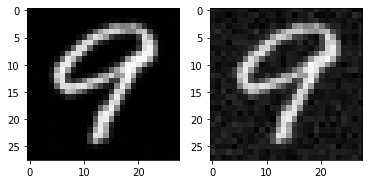

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5458.1885
batch loss value:  4958.9688
batch loss value:  4935.796
batch loss value:  4617.046
batch loss value:  5435.8345
batch loss value:  4776.3633
batch loss value:  4896.426
batch loss value:  4938.326
batch loss value:  4999.0063
batch loss value:  4645.336
iteration: 9200 loss: 5317.127930
time step for image 117


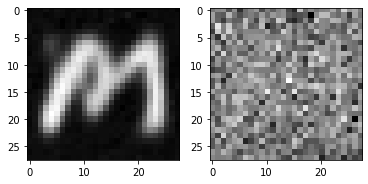

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5093.446
batch loss value:  5073.203
batch loss value:  4806.074
batch loss value:  4735.3184
batch loss value:  4693.7266
batch loss value:  4771.2188
batch loss value:  5119.3984
batch loss value:  4676.6914
batch loss value:  4779.614
batch loss value:  4956.471
iteration: 9300 loss: 5358.179688
time step for image 89


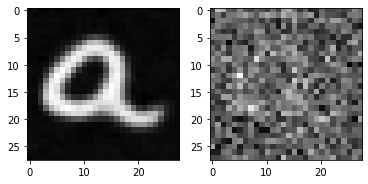

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4402.7056
batch loss value:  4632.079
batch loss value:  4356.0303
batch loss value:  4690.802
batch loss value:  4492.967
batch loss value:  4768.3647
batch loss value:  5234.127
batch loss value:  4937.9756
batch loss value:  4648.8096
batch loss value:  4415.9663
iteration: 9400 loss: 5507.046875
time step for image 62


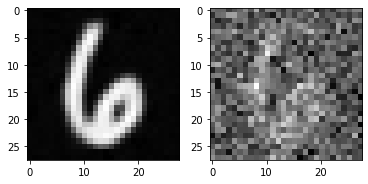

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4480.05
batch loss value:  4878.9214
batch loss value:  4611.3203
batch loss value:  4727.235
batch loss value:  4900.123
batch loss value:  5198.859
batch loss value:  5399.5244
batch loss value:  4719.0576
batch loss value:  4712.113
batch loss value:  4839.6396
iteration: 9500 loss: 5416.645508
time step for image 140


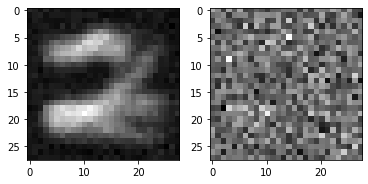

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  5315.577
batch loss value:  5046.792
batch loss value:  4762.4355
batch loss value:  4756.2295
batch loss value:  4743.681
batch loss value:  4887.1113
batch loss value:  5224.795
batch loss value:  4697.962
batch loss value:  4891.3257
batch loss value:  4774.431
iteration: 9600 loss: 5562.454102
time step for image 70


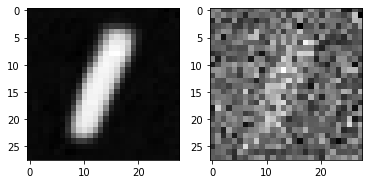

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4765.566
batch loss value:  5030.454
batch loss value:  4684.099
batch loss value:  4748.585
batch loss value:  4902.8604
batch loss value:  5023.5405
batch loss value:  4631.0273
batch loss value:  5177.045
batch loss value:  4656.61
batch loss value:  4685.461
iteration: 9700 loss: 5341.276367
time step for image 33


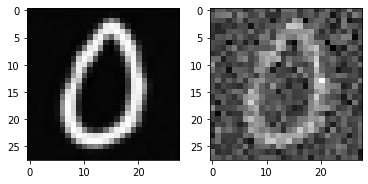

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4936.5503
batch loss value:  4865.6396
batch loss value:  4824.774
batch loss value:  5130.1084
batch loss value:  4695.8936
batch loss value:  5054.295
batch loss value:  4697.3105
batch loss value:  5010.1157
batch loss value:  4417.1895
batch loss value:  4739.17
iteration: 9800 loss: 5271.531250
time step for image 75


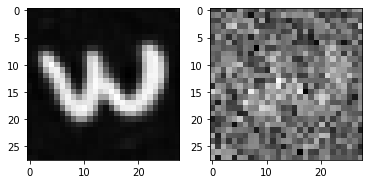

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4948.9697
batch loss value:  4450.7627
batch loss value:  5379.54
batch loss value:  4660.835
saving iteration: 9840 loss: 5129.695312
batch loss value:  5259.435
batch loss value:  4944.5967
batch loss value:  4540.7964
batch loss value:  4936.1416
batch loss value:  5046.5234
batch loss value:  4593.7744
iteration: 9900 loss: 5366.085938
time step for image 97


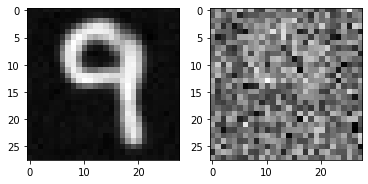

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

batch loss value:  4865.061
batch loss value:  4624.339
batch loss value:  4839.1553
batch loss value:  4629.9746
batch loss value:  4746.466
batch loss value:  4670.948
batch loss value:  4732.537
batch loss value:  4755.2705
batch loss value:  4726.049


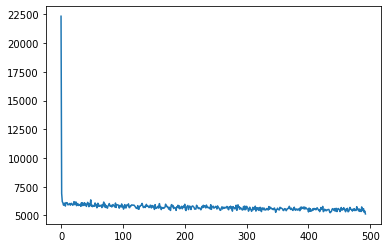

In [98]:
data_noisy, data_in_batch, timestep, losses, avg_params = train_model(opt_state, params, avg_params, model_name, train_new_model = train_new_model, energy_method=False)
plt.plot(losses)

In [99]:
def param_count(pytree):
  return sum(x.size for x in jax.tree_util.tree_leaves(pytree))

param_count(avg_params)

1103073

## Full generation model

In [100]:
mean_coeff_1 = jnp.sqrt(alphas)*(1 - alphas_prev_) / variance
mean_coeff_2 = jnp.sqrt(alphas_prev_) * betas / variance

In [101]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    batch_size_generation = 128
    unique_key = jax.random.fold_in(key, 0)
    _, subkey = jax.random.split(unique_key)
    _, *subkeys = jax.random.split(unique_key, timesteps+1)
    
    # need to generate new keys everytime
    data_noisy = jax.random.normal(subkey, shape=(batch_size_generation, 28, 28, 1))
    # data_orig, label = next(create_input_iter(train_ds))
    # data_orig = (data_orig[0][0:batch_size_generation])
    label = jnp.mod(jnp.arange(0, batch_size_generation), 63)
    # data_noisy, _ = get_noisy(subkey, data_orig, jnp.array([timesteps]))
      
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy

    for t in range(1, timesteps+1):
        timestep = timesteps-t
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated, label)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas[timestep])) - jnp.log(sd[timestep]))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(alphas[timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas[timestep])/jnp.sqrt(alphas[timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 0:
                x_reconstructed = jnp.clip(x_reconstructed, 0., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)

        posterior_data = posterior_variance_corrected[timestep]
        data_noisy = jax.random.normal(subkeys[t-1], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch

In [102]:
datas, data_in_batch = generate_data(avg_params, energy_method=False, clipped_version=True, labels="mixed")

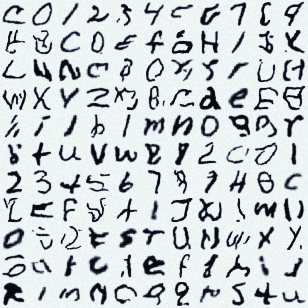

In [103]:
rawarrview(reshape_image_batch(data_in_batch.squeeze()), cmap='bone_r')

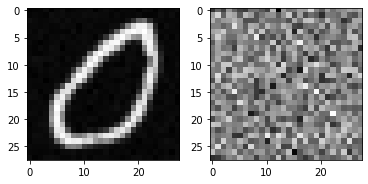

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [104]:
_, (plt1, plt2) = plt.subplots(1, 2)
show_image(unnormalize(data_in_batch[1]), plt1)
show_image(unnormalize(datas[0][1]), plt2)
# show_image((data_orig[0]), plt3)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

In [105]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for i in range(0, timesteps):
    im = plt.imshow(datas[i][0], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_full_with_cond.gif', writer='pillow')

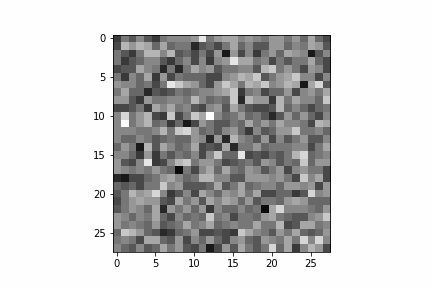

In [106]:
with open(gifs_dir + 'diffusion_generation_full_with_cond.gif','rb') as f:
  display(Image(data=f.read(), format='png'))

## strided sampling

In [107]:
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L196
## https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils_2.py#L78
posterior_variance = (betas) * (1 - alphas_prev_) / (1 - alphas_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance[1], posterior_variance[1:]]))
posterior_variance_corrected = jnp.exp(log_posterior_variance)

strided_schedule = jnp.array(list(range(1, timesteps, 5)) + [timesteps])

alphas_strided_ = alphas_[strided_schedule]
alphas_prev_strided_ = jnp.pad(alphas_strided_[:-1], [1, 0], "constant", constant_values=1.0)

betas_strided = 1 - (alphas_strided_/alphas_prev_strided_)
posterior_variance_new_schedule = betas_strided * (1 - alphas_prev_strided_)/ (1-alphas_strided_)
log_posterior_variance = jnp.log(jnp.hstack([posterior_variance_new_schedule[1], posterior_variance_new_schedule[1:]]))
posterior_variance_new_schedule_corrected = jnp.exp(log_posterior_variance)

In [108]:
mean_coeff_1 = jnp.sqrt(1-betas_strided)*(1 - alphas_prev_strided_) / (1 - alphas_strided_)
mean_coeff_2 = jnp.sqrt(alphas_prev_strided_) * betas_strided / (1 - alphas_strided_)

In [109]:
def generate_data(avg_params, energy_method=False, clipped_version=False, labels=None):
    batch_size_generation = 512
    
    unique_key = jax.random.fold_in(key, 1)
    _, subkey = jax.random.split(unique_key)
    _, *subkeys = jax.random.split(unique_key, len(strided_schedule)+1)
    
    data_noisy = jax.random.normal(subkey, shape=(batch_size_generation, 28, 28, 1))
    label = jnp.mod(jnp.arange(0, batch_size_generation), 63)
    # data_orig, label = next(create_input_iter(train_ds))
    # data_orig = (data_orig[0][0:batch_size_generation])
    # label = label[0][0:batch_size_generation]
    # data_noisy, _ = get_noisy(subkey, data_orig, jnp.array([timesteps]))
          
    datas = []
    datas.append(jax.device_get(data_noisy))
    data_in_batch = data_noisy                               
    for t in range(1, len(strided_schedule)+1):
        stride_timestep = len(strided_schedule)-t
        timestep = strided_schedule[stride_timestep]
        t_repeated = jnp.repeat(jnp.array([timestep]), batch_size_generation)
        # data_stacked = torch.vstack([data_in_batch, labelled_values])
        pred_data = net.apply(avg_params, data_in_batch, t_repeated, label)
        if not clipped_version:
            if not energy_method:
                # optimization:: not sure if exp(log(x) - log(y)) instead of x/y helps numerically
                multiplier = jnp.exp(jnp.log((betas_strided[stride_timestep])) - jnp.log(jnp.sqrt(1- alphas_strided_[stride_timestep])))
                mean_data = jnp.subtract(data_in_batch, pred_data * multiplier)/jnp.sqrt(1-betas_strided[stride_timestep])
            else:
                ##
                # Energy function interpretation
                mean_data = jnp.add(data_in_batch, pred_data * betas_strided[stride_timestep])/jnp.sqrt(1-betas_strided[stride_timestep])
                ##
        else:
            # clipping an improvement as recommended in https://github.com/hojonathanho/diffusion/blob/1e0dceb3b3495bbe19116a5e1b3596cd0706c543/diffusion_tf/diffusion_utils.py#L171
            # this helps in improving the samples generated as it keeps the random variables in the range of -1 to +1
            if not energy_method:
                x_reconstructed = jnp.subtract(data_in_batch, pred_data * sd[timestep])/ jnp.sqrt(alphas_[timestep])
            else:
                # energy method and clipping to improve stabalization
                x_reconstructed = jnp.add(data_in_batch, pred_data * variance[timestep])/ jnp.sqrt(alphas_[timestep])

            if timestep >= 0:
                x_reconstructed = jnp.clip(x_reconstructed, 0., 1.)

            mean_data_1 = data_in_batch * mean_coeff_1[stride_timestep]
            mean_data_2 = x_reconstructed * mean_coeff_2[stride_timestep]
            mean_data = jnp.add(mean_data_1, mean_data_2)



        posterior_data = posterior_variance_new_schedule_corrected[stride_timestep]
        data_noisy = jax.random.normal(subkeys[t-1], shape=(batch_size_generation, 28, 28, 1))
        data_in_batch = jnp.add(mean_data,  jnp.sqrt(posterior_data) * data_noisy)
        datas.append(jax.device_get(data_in_batch))
    return datas, data_in_batch

In [110]:
datas, data_in_batch = generate_data(avg_params, energy_method=False, clipped_version=True, labels="mixed")

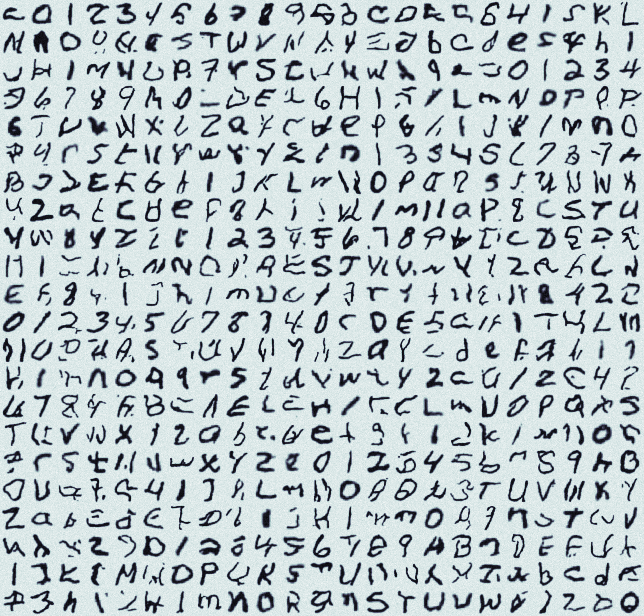

In [111]:
rawarrview(reshape_image_batch(data_in_batch.squeeze()), cmap='bone_r')

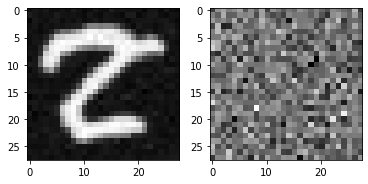

<Figure size 144x144 with 0 Axes>

<Figure size 144x144 with 0 Axes>

In [112]:
_, (plt1, plt2) = plt.subplots(1, 2)
show_image(unnormalize(data_in_batch[3]), plt1)
show_image(unnormalize(datas[0][3]), plt2)

# data_noisy, _ = get_noisy(data_orig, jnp.array([60]))
# show_image(unnormalize(data_noisy[0]), plt1)

In [113]:
%%capture 

fig = plt.figure()
ims = []

if colab:
  datas = einops.rearrange(datas, 'x b h w c -> x b h (w c)')
  
for i in range(0, len(strided_schedule)):
    im = plt.imshow(datas[i][3], cmap="gray", animated=True)
    ims.append([im])

animate = animation.ArtistAnimation(fig, ims, interval=5, blit=True, repeat_delay=3000)
animate.save(gifs_dir + 'diffusion_generation_strided_with_cond.gif', writer='pillow')

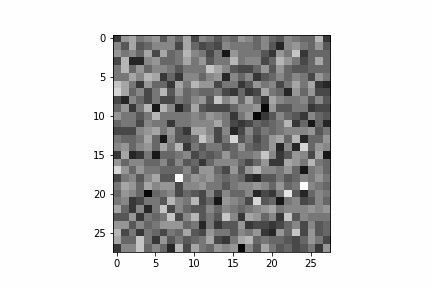

In [114]:
with open(gifs_dir + 'diffusion_generation_strided_with_cond.gif','rb') as f:
  display(Image(data=f.read(), format='png'))